<a href="https://colab.research.google.com/github/johnnyff/bigcontest2021/blob/main/bigcontest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install pycaret


from pycaret.utils import enable_colab
enable_colab()
from pycaret.regression import *


import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import warnings
from tqdm import tqdm


warnings.filterwarnings(action='ignore') 


Colab mode enabled.


In [3]:
df = pd.read_excel('/content/drive/MyDrive/bigcontest/data/bigcontest_dataset.xlsx', header = 1)
df

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,유역평균강수,강우(A지역),강우(B지역),강우(C지역),강우(D지역),수위(E지역),수위(D지역),유역평균강수.1,강우(A지역).1,강우(B지역).1,강우(C지역).1,강우(D지역).1,수위(E지역).1,수위(D지역).1,유역평균강수.2,강우(A지역).2,강우(B지역).2,강우(C지역).2,강우(D지역).2,수위(E지역).2,수위(D지역).2,유역평균강수.3,강우(A지역).3,강우(B지역).3,강우(C지역).3,강우(D지역).3,수위(E지역).3,수위(D지역).3,유역평균강수.4,강우(A지역).4,강우(B지역).4,강우(C지역).4,강우(D지역).4,수위(E지역).4,수위(D지역).4,유역평균강수.5,강우(A지역).5,강우(B지역).5,강우(C지역).5,강우(D지역).5,수위(E지역).5,수위(D지역).5
0,1,2006,7,10,8,189.100000,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,1,2006,7,10,9,216.951962,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,1,2006,7,10,10,251.424419,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,1,2006,7,10,11,302.812199,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,1,2006,7,10,12,384.783406,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,10,10,2.53,122.575000,11.3000,9,12,10,11,2.53,122.575000,14.4000,12,12,18,16,2.53,122.639286,14.4000,12,12,18,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,26,2018,7,7,17,NaN,2.3689,1,0,0,0,3.16,129.99375,2.3689,1,0,0,0,3.16,130.016667,2.3689,1,0,0,0,3.16,130.025000,2.3689,1,0,1,0,3.16,129.882143,2.3689,1,0,1,0,3.16,129.916,2.1722,1,0,0,0,3.16,129.950
3047,26,2018,7,7,18,NaN,2.3689,1,0,0,0,3.15,130.00625,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,1,0,3.15,129.896429,2.3689,1,0,1,0,3.15,129.928,2.0805,1,0,0,0,3.15,129.970
3048,26,2018,7,7,19,NaN,2.3689,1,0,0,0,3.13,130.01250,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,1,0,3.13,129.910714,2.3689,1,0,1,0,3.13,129.940,2.0354,1,0,0,0,3.13,129.980
3049,26,2018,7,7,20,NaN,2.3689,1,0,0,0,3.11,130.01875,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,1,0,3.11,129.925000,2.3488,1,0,1,0,3.11,129.952,1.8993,1,0,0,0,3.11,129.990


In [4]:
columns = ['num','year','month','day','hour','target',
           'average_rain_1','a_rain_1','b_rain_1','c_rain_1','d_rain_1','e_level_1','d_level_1',
           'average_rain_2','a_rain_2','b_rain_2','c_rain_2','d_rain_2','e_level_2','d_level_2',
           'average_rain_3','a_rain_3','b_rain_3','c_rain_3','d_rain_3','e_level_3','d_level_3',
           'average_rain_4','a_rain_4','b_rain_4','c_rain_4','d_rain_4','e_level_4','d_level_4',
           'average_rain_5','a_rain_5','b_rain_5','c_rain_5','d_rain_5','e_level_5','d_level_5',
           'average_rain_6','a_rain_6','b_rain_6','c_rain_6','d_rain_6','e_level_6','d_level_6'
           ]

In [5]:
df.columns =columns
df

,num,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,2006,7,10,8,189.100000,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,1,2006,7,10,9,216.951962,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,1,2006,7,10,10,251.424419,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,1,2006,7,10,11,302.812199,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,1,2006,7,10,12,384.783406,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,10,10,2.53,122.575000,11.3000,9,12,10,11,2.53,122.575000,14.4000,12,12,18,16,2.53,122.639286,14.4000,12,12,18,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,26,2018,7,7,17,NaN,2.3689,1,0,0,0,3.16,129.99375,2.3689,1,0,0,0,3.16,130.016667,2.3689,1,0,0,0,3.16,130.025000,2.3689,1,0,1,0,3.16,129.882143,2.3689,1,0,1,0,3.16,129.916,2.1722,1,0,0,0,3.16,129.950
3047,26,2018,7,7,18,NaN,2.3689,1,0,0,0,3.15,130.00625,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,1,0,3.15,129.896429,2.3689,1,0,1,0,3.15,129.928,2.0805,1,0,0,0,3.15,129.970
3048,26,2018,7,7,19,NaN,2.3689,1,0,0,0,3.13,130.01250,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,1,0,3.13,129.910714,2.3689,1,0,1,0,3.13,129.940,2.0354,1,0,0,0,3.13,129.980
3049,26,2018,7,7,20,NaN,2.3689,1,0,0,0,3.11,130.01875,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,1,0,3.11,129.925000,2.3488,1,0,1,0,3.11,129.952,1.8993,1,0,0,0,3.11,129.990


In [6]:
df.iloc[2196,0]=20
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   num             3051 non-null   int64  
 1   year            3051 non-null   int64  
 2   month           3051 non-null   int64  
 3   day             3051 non-null   int64  
 4   hour            3051 non-null   int64  
 5   target          2891 non-null   float64
 6   average_rain_1  3051 non-null   float64
 7   a_rain_1        3051 non-null   int64  
 8   b_rain_1        3051 non-null   int64  
 9   c_rain_1        3051 non-null   int64  
 10  d_rain_1        3051 non-null   int64  
 11  e_level_1       3051 non-null   float64
 12  d_level_1       3051 non-null   float64
 13  average_rain_2  3051 non-null   float64
 14  a_rain_2        3051 non-null   int64  
 15  b_rain_2        3051 non-null   int64  
 16  c_rain_2        3051 non-null   int64  
 17  d_rain_2        3051 non-null   i

In [7]:
import datetime as dt

for i in range(len(df)):
  year= df['year'][i]
  month= df['month'][i]
  day= df['day'][i]
  hour= df['hour'][i]
  if (hour == 24):
      day +=1
      hour = 0
  try:
    df['hour'][i] = dt.datetime(year, month, day, hour)
  except (ValueError):
    day = 1
    month += 1
    df['hour'][i] = dt.datetime(year, month, day, hour)

df


  


,num,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,2006,7,10,2006-07-10 08:00:00,189.100000,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,1,2006,7,10,2006-07-10 09:00:00,216.951962,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,1,2006,7,10,2006-07-10 10:00:00,251.424419,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,1,2006,7,10,2006-07-10 11:00:00,302.812199,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,1,2006,7,10,2006-07-10 12:00:00,384.783406,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,10,10,2.53,122.575000,11.3000,9,12,10,11,2.53,122.575000,14.4000,12,12,18,16,2.53,122.639286,14.4000,12,12,18,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,26,2018,7,7,2018-07-07 17:00:00,NaN,2.3689,1,0,0,0,3.16,129.99375,2.3689,1,0,0,0,3.16,130.016667,2.3689,1,0,0,0,3.16,130.025000,2.3689,1,0,1,0,3.16,129.882143,2.3689,1,0,1,0,3.16,129.916,2.1722,1,0,0,0,3.16,129.950
3047,26,2018,7,7,2018-07-07 18:00:00,NaN,2.3689,1,0,0,0,3.15,130.00625,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,1,0,3.15,129.896429,2.3689,1,0,1,0,3.15,129.928,2.0805,1,0,0,0,3.15,129.970
3048,26,2018,7,7,2018-07-07 19:00:00,NaN,2.3689,1,0,0,0,3.13,130.01250,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,1,0,3.13,129.910714,2.3689,1,0,1,0,3.13,129.940,2.0354,1,0,0,0,3.13,129.980
3049,26,2018,7,7,2018-07-07 20:00:00,NaN,2.3689,1,0,0,0,3.11,130.01875,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,1,0,3.11,129.925000,2.3488,1,0,1,0,3.11,129.952,1.8993,1,0,0,0,3.11,129.990


### EDA

In [33]:
bf= pd.DataFrame()
bf['average'] =df.groupby("num")['target'].sum()/df.groupby("num")['target'].count()
bf['first_value'] = df.groupby("num")['target'].first()
bf['last_value'] = df.groupby("num")['target'].last()
bf['count'] = df.groupby("num")['target'].count()
bf

,average,first_value,last_value,count
num,,,,
1,4616.111356,189.100000,3285.961383,226
2,2663.703120,323.993267,2860.825742,100
3,1614.117957,221.050131,1803.656004,81
4,2202.106035,161.803002,3171.930357,34
5,2626.792297,251.514771,756.516668,94
6,1226.443993,127.124154,1182.471359,46
7,3485.944061,568.923863,2045.886470,51
8,3395.316748,1793.964445,4002.598904,41
9,1611.971984,1011.388849,1302.748650,68


In [34]:
bf = bf.merge(df[['hour','target']], how= 'inner', left_on = 'first_value', right_on = 'target')[:26]

In [35]:
bf = bf.merge(df[['hour','target']], how= 'inner', left_on = 'last_value', right_on = 'target')[:26]
bf.head()

,average,first_value,last_value,count,hour_x,target_x,hour_y,target_y
0,4616.111356,189.100000,3285.961383,226,2006-07-10 08:00:00,189.100000,2006-07-19 17:00:00,3285.961383
1,2663.703120,323.993267,2860.825742,100,2006-07-26 00:00:00,323.993267,2006-07-30 03:00:00,2860.825742
2,1614.117957,221.050131,1803.656004,81,2007-08-03 17:00:00,221.050131,2007-08-07 01:00:00,1803.656004
3,2202.106035,161.803002,3171.930357,34,2007-09-14 15:00:00,161.803002,2007-09-16 00:00:00,3171.930357
4,2626.792297,251.514771,756.516668,94,2008-07-23 21:00:00,251.514771,2008-07-27 18:00:00,756.516668


In [36]:
bf.drop(['target_x','target_y'],axis =1 , inplace = True)
bf

,average,first_value,last_value,count,hour_x,hour_y
0,4616.111356,189.100000,3285.961383,226,2006-07-10 08:00:00,2006-07-19 17:00:00
1,2663.703120,323.993267,2860.825742,100,2006-07-26 00:00:00,2006-07-30 03:00:00
2,1614.117957,221.050131,1803.656004,81,2007-08-03 17:00:00,2007-08-07 01:00:00
3,2202.106035,161.803002,3171.930357,34,2007-09-14 15:00:00,2007-09-16 00:00:00
4,2626.792297,251.514771,756.516668,94,2008-07-23 21:00:00,2008-07-27 18:00:00
5,1226.443993,127.124154,1182.471359,46,2009-07-09 01:00:00,2009-07-10 22:00:00
6,3485.944061,568.923863,2045.886470,51,2009-07-11 19:00:00,2009-07-13 21:00:00
7,3395.316748,1793.964445,4002.598904,41,2009-07-14 00:00:00,2009-07-15 16:00:00
8,1611.971984,1011.388849,1302.748650,68,2009-07-17 15:00:00,2009-07-20 10:00:00
9,979.030632,95.413282,861.718492,86,2009-08-10 19:00:00,2009-08-14 08:00:00


In [38]:
bf.merge(df, how = 'inner', left_on = "first_value", right_on = 'target')[:25]

,average,first_value,last_value,count,hour_x,hour_y,num,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,4616.111356,189.100000,3285.961383,226,2006-07-10 08:00:00,2006-07-19 17:00:00,1,2006,7,10,2006-07-10 08:00:00,189.100000,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,2663.703120,323.993267,2860.825742,100,2006-07-26 00:00:00,2006-07-30 03:00:00,2,2006,7,25,2006-07-26 00:00:00,323.993267,0.0000,0,1,0,0,2.93,134.44375,0.0000,0,1,0,0,2.93,134.408333,0.0000,0,1,0,0,2.93,134.391667,0.5000,0,1,1,0,2.93,134.521429,0.5000,0,1,1,0,2.93,134.500,0.5000,0,1,1,0,2.93,134.475
2,1614.117957,221.050131,1803.656004,81,2007-08-03 17:00:00,2007-08-07 01:00:00,3,2007,8,3,2007-08-03 17:00:00,221.050131,11.4000,6,6,0,1,2.64,129.36250,11.4000,6,6,0,1,2.64,129.383333,11.4000,6,6,0,1,2.64,129.383333,12.1000,6,6,12,1,2.64,129.335714,12.1000,6,6,12,1,2.64,129.328,11.9000,6,6,1,0,2.64,129.345
3,2202.106035,161.803002,3171.930357,34,2007-09-14 15:00:00,2007-09-16 00:00:00,4,2007,9,14,2007-09-14 15:00:00,161.803002,0.0000,0,0,0,0,2.53,140.34375,0.0000,0,0,0,0,2.53,140.300000,0.0000,0,0,0,0,2.53,140.283333,0.6000,0,0,1,3,2.53,140.439286,0.6000,0,0,1,3,2.53,140.408,0.6000,0,0,1,3,2.53,140.380
4,2626.792297,251.514771,756.516668,94,2008-07-23 21:00:00,2008-07-27 18:00:00,5,2008,7,23,2008-07-23 21:00:00,251.514771,1.8310,0,0,1,0,2.46,121.50000,1.7315,0,0,1,0,2.46,121.500000,1.7315,0,0,1,0,2.46,121.500000,1.7428,0,0,3,0,2.46,121.500000,1.6273,0,0,3,0,2.46,121.500,1.6273,0,0,2,0,2.46,121.500
5,1226.443993,127.124154,1182.471359,46,2009-07-09 01:00:00,2009-07-10 22:00:00,6,2009,7,9,2009-07-09 01:00:00,127.124154,12.0384,9,15,13,13,1.80,120.00000,12.0384,9,15,6,13,1.80,120.000000,12.0384,9,15,3,13,1.80,120.000000,12.0646,9,15,15,12,1.80,120.000000,11.9392,9,15,15,12,1.80,120.000,11.9048,9,15,1,6,1.80,120.000
6,3485.944061,568.923863,2045.886470,51,2009-07-11 19:00:00,2009-07-13 21:00:00,7,2009,7,11,2009-07-11 19:00:00,568.923863,87.0887,120,61,0,0,3.68,123.08125,80.7006,120,52,0,0,3.68,123.116667,80.7006,120,8,0,0,3.68,123.125000,71.9056,120,8,22,0,3.68,122.907143,60.9238,120,8,22,0,3.68,122.968,13.7890,120,15,0,0,3.68,123.035
7,3395.316748,1793.964445,4002.598904,41,2009-07-14 00:00:00,2009-07-15 16:00:00,8,2009,7,13,2009-07-14 00:00:00,1793.964445,143.3948,212,126,87,115,5.55,130.85000,143.3948,212,126,78,115,5.55,131.100000,143.3948,212,125,77,99,5.55,131.158333,143.4697,212,125,116,84,5.55,129.550000,143.4697,212,125,116,84,5.55,130.020,142.8932,212,126,68,62,5.55,130.485
8,1611.971984,1011.388849,1302.748650,68,2009-07-17 15:00:00,2009-07-20 10:00:00,9,2009,7,17,2009-07-17 15:00:00,1011.388849,0.1493,0,1,0,0,3.78,134.44375,0.1493,0,1,0,0,3.78,134.383333,0.1493,0,1,0,0,3.78,134.341667,0.2247,0,1,0,0,3.78,134.560714,0.2057,0,1,0,0,3.78,134.532,0.2057,0,1,0,0,3.78,134.500
9,979.030632,95.413282,861.718492,86,2009-08-10 19:00:00,2009-08-14 08:00:00,10,2009,8,10,2009-08-10 19:00:00,95.413282,0.4451,7,0,0,0,1.91,127.76250,0.4451,7,0,0,0,1.91,127.750000,0.4451,7,0,0,0,1.91,127.733333,0.4536,7,0,0,0,1.91,127.771429,0.3114,7,0,0,0,1.91,127.768,0.0237,7,0,0,0,1.91,127.770


결측치 확인

In [8]:

df.isnull().sum()

num                 0
year                0
month               0
day                 0
hour                0
target            160
average_rain_1      0
a_rain_1            0
b_rain_1            0
c_rain_1            0
d_rain_1            0
e_level_1           0
d_level_1           0
average_rain_2      0
a_rain_2            0
b_rain_2            0
c_rain_2            0
d_rain_2            0
e_level_2           0
d_level_2           0
average_rain_3      0
a_rain_3            0
b_rain_3            0
c_rain_3            0
d_rain_3            0
e_level_3           0
d_level_3           0
average_rain_4      0
a_rain_4            0
b_rain_4            0
c_rain_4            0
d_rain_4            0
e_level_4           0
d_level_4           0
average_rain_5      0
a_rain_5            0
b_rain_5            0
c_rain_5            0
d_rain_5            0
e_level_5           0
d_level_5           0
average_rain_6      0
a_rain_6            0
b_rain_6            0
c_rain_6            0
d_rain_6  

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3051 entries, 0 to 3050
Data columns (total 48 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   num             3051 non-null   int64  
 1   year            3051 non-null   int64  
 2   month           3051 non-null   int64  
 3   day             3051 non-null   int64  
 4   hour            3051 non-null   object 
 5   target          2891 non-null   float64
 6   average_rain_1  3051 non-null   float64
 7   a_rain_1        3051 non-null   int64  
 8   b_rain_1        3051 non-null   int64  
 9   c_rain_1        3051 non-null   int64  
 10  d_rain_1        3051 non-null   int64  
 11  e_level_1       3051 non-null   float64
 12  d_level_1       3051 non-null   float64
 13  average_rain_2  3051 non-null   float64
 14  a_rain_2        3051 non-null   int64  
 15  b_rain_2        3051 non-null   int64  
 16  c_rain_2        3051 non-null   int64  
 17  d_rain_2        3051 non-null   i

In [10]:
df.describe()

,num,year,month,day,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
count,3051.000000,3051.000000,3051.000000,3051.000000,2891.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000,3051.000000
mean,14.936742,2011.145198,7.404130,15.106850,1746.902717,67.938486,78.058669,64.361849,39.822353,53.558178,4.564936,131.539823,68.420307,81.216978,63.484104,39.237955,53.558178,4.564936,131.611259,68.420307,81.216978,57.197640,39.462144,53.958047,4.564936,131.648782,68.894845,82.796132,57.197640,51.313668,55.723697,4.564936,131.378003,67.093879,82.796132,57.197640,51.313668,55.723697,4.564936,131.424801,61.540773,82.796132,58.112422,38.908882,53.596198,4.564936,131.471568
std,7.575733,3.097788,0.689192,7.850888,2181.790290,59.359959,71.874728,63.369565,46.097700,56.327987,2.375226,6.061602,59.315391,72.927209,62.906248,45.493394,56.327987,2.375226,6.060190,59.315391,72.927209,59.607926,45.461439,56.342398,2.375226,6.056126,59.261035,73.434296,59.607926,52.312274,56.848675,2.375226,6.051400,58.399205,73.434296,59.607926,52.312274,56.848675,2.375226,6.054328,55.735872,73.434296,60.093366,44.747886,55.649384,2.375226,6.060749
min,1.000000,2006.000000,6.000000,1.000000,3.541153,0.000000,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000,0.000000,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000,0.000000,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000,0.017700,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000,0.017700,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000,0.017700,0.000000,0.000000,0.000000,0.000000,1.070000,118.700000
25%,10.000000,2009.000000,7.000000,10.000000,384.762514,20.500000,22.000000,13.000000,3.000000,7.000000,2.810000,127.331250,20.917250,23.000000,13.000000,3.000000,7.000000,2.810000,127.333333,20.917250,23.000000,9.000000,3.000000,7.000000,2.810000,127.341667,21.100000,23.000000,9.000000,8.000000,9.000000,2.810000,127.275000,20.431100,23.000000,9.000000,8.000000,9.000000,2.810000,127.296000,16.002550,23.000000,10.000000,3.000000,7.000000,2.810000,127.317500
50%,16.000000,2011.000000,7.000000,15.000000,1065.549253,57.198300,55.000000,52.000000,22.000000,35.000000,4.080000,133.012500,58.500000,57.000000,52.000000,21.000000,35.000000,4.080000,133.050000,58.500000,57.000000,44.000000,22.000000,37.000000,4.080000,133.058333,59.100000,59.000000,44.000000,33.000000,38.000000,4.080000,133.035714,56.117700,59.000000,44.000000,33.000000,38.000000,4.080000,133.028000,47.411600,59.000000,46.000000,22.000000,37.000000,4.080000,133.010000
75%,22.000000,2013.000000,8.000000,20.000000,2213.014288,103.226400,121.000000,91.000000,65.000000,85.000000,5.580000,135.175000,103.413650,123.000000,90.000000,64.000000,85.000000,5.580000,135.200000,103.413650,123.000000,84.000000,64.000000,85.000000,5.580000,135.200000,103.424300,127.000000,84.000000,79.000000,86.000000,5.580000,135.110714,101.150000,127.000000,84.000000,79.000000,86.000000,5.580000,135.132000,92.500000,127.000000,85.000000,63.000000,85.000000,5.580000,135.147500
max,26.000000,2018.000000,9.000000,31.000000,21504.402260,328.400000,329.000000,367.000000,253.000000,262.000000,16.720000,143.893750,328.400000,337.000000,367.000000,251.

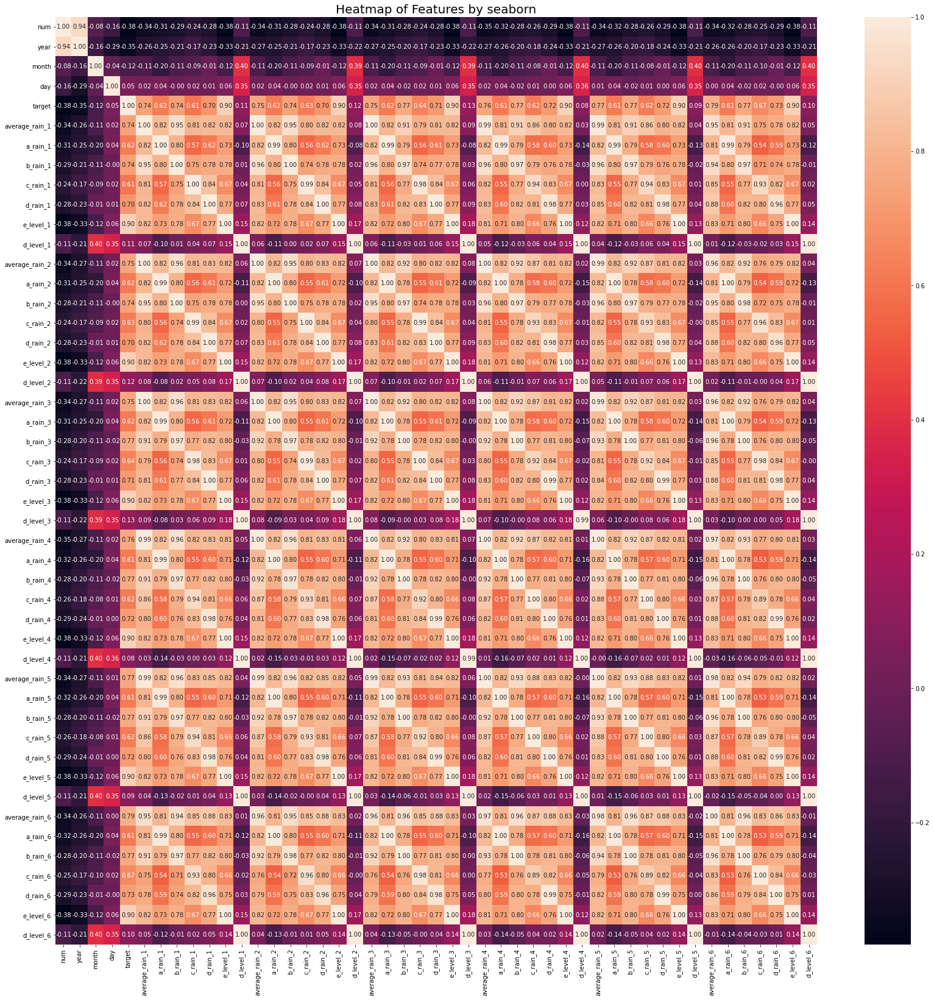

In [76]:
plt.figure(figsize = (28,28))
sns.heatmap(data = df.corr(), annot= True, fmt = ".2f")

plt.title('Heatmap of Features by seaborn',fontsize=20)

!pip install filterpyplt.show()

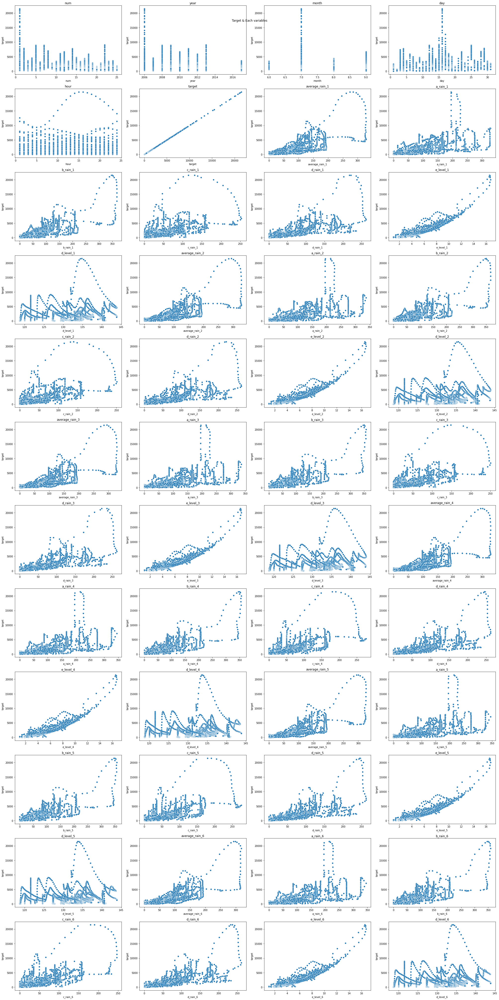

In [ ]:
fig, ax = plt.subplots(12,4, figsize=(28,56))
ax = ax.flatten()

fig.suptitle("Target & Each variables")

for i, column in enumerate(df.columns):
  sns.scatterplot(x= column, y= 'target', data = df, ax = ax[i])
  ax[i].set(title = column)
plt.tight_layout()

dd특정 날짜에 특별한 움직임이 보이는 것 같음
* 더 이상의 EDA는 진행하지 않음. 각 데이터는 독립! (주어짐)

### 데이터 전처리

In [11]:
df

,num,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,2006,7,10,2006-07-10 08:00:00,189.100000,6.4000,7,7,7,8,2.54,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610
1,1,2006,7,10,2006-07-10 09:00:00,216.951962,6.3000,7,8,7,8,2.53,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600
2,1,2006,7,10,2006-07-10 10:00:00,251.424419,6.4000,7,9,7,8,2.53,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590
3,1,2006,7,10,2006-07-10 11:00:00,302.812199,7.3000,7,10,7,8,2.53,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585
4,1,2006,7,10,2006-07-10 12:00:00,384.783406,8.2000,7,12,8,10,2.53,122.55625,11.3000,9,12,10,10,2.53,122.575000,11.3000,9,12,10,11,2.53,122.575000,14.4000,12,12,18,16,2.53,122.639286,14.4000,12,12,18,16,2.53,122.604,14.4000,12,12,18,16,2.53,122.575
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,26,2018,7,7,2018-07-07 17:00:00,NaN,2.3689,1,0,0,0,3.16,129.99375,2.3689,1,0,0,0,3.16,130.016667,2.3689,1,0,0,0,3.16,130.025000,2.3689,1,0,1,0,3.16,129.882143,2.3689,1,0,1,0,3.16,129.916,2.1722,1,0,0,0,3.16,129.950
3047,26,2018,7,7,2018-07-07 18:00:00,NaN,2.3689,1,0,0,0,3.15,130.00625,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,0,0,3.15,130.025000,2.3689,1,0,1,0,3.15,129.896429,2.3689,1,0,1,0,3.15,129.928,2.0805,1,0,0,0,3.15,129.970
3048,26,2018,7,7,2018-07-07 19:00:00,NaN,2.3689,1,0,0,0,3.13,130.01250,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,0,0,3.13,130.025000,2.3689,1,0,1,0,3.13,129.910714,2.3689,1,0,1,0,3.13,129.940,2.0354,1,0,0,0,3.13,129.980
3049,26,2018,7,7,2018-07-07 20:00:00,NaN,2.3689,1,0,0,0,3.11,130.01875,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,0,0,3.11,130.025000,2.3689,1,0,1,0,3.11,129.925000,2.3488,1,0,1,0,3.11,129.952,1.8993,1,0,0,0,3.11,129.990


173.18309268337907 [  0.         -78.11812508  71.91386967]


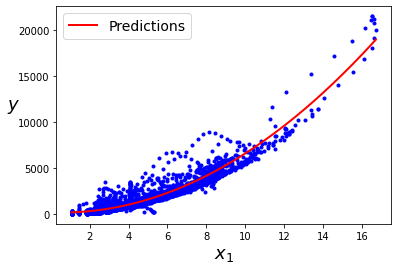

In [12]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

poly_features = PolynomialFeatures(degree=2, include_bias=True)
X_poly = poly_features.fit_transform(np.array(df['e_level_5'][:-180]).reshape(-1,1))


lin_reg = LinearRegression()
lin_reg.fit(X_poly, np.array(df['target'][:-180]))
print(lin_reg.intercept_ , lin_reg.coef_)


X_new=np.linspace(df['e_level_5'][:-180].min(), df['e_level_5'][:-180].max(), len(df['e_level_5'][:-180])).reshape(-1,1)
X_new_poly = poly_features.transform(X_new)
y_new = lin_reg.predict(X_new_poly)
plt.plot(df['e_level_5'][:-180], df['target'][:-180], "b.")
plt.plot(X_new, y_new, "r-", linewidth=2, label="Predictions")
plt.xlabel("$x_1$", fontsize=18)
plt.ylabel("$y$", rotation=0, fontsize=18)
plt.legend(loc="upper left", fontsize=14)
plt.show()

In [12]:
!pip install filterpy

     |████████████████████████████████| 177 kB 6.8 MB/s 
  Created wheel for filterpy: filename=filterpy-1.4.5-py3-none-any.whl size=110474 sha256=709d33023509071e693cb3c80cd3a6d08e7baf27dcb77a4c32feba998bd571c6
  Stored in directory: /root/.cache/pip/wheels/ce/e0/ee/a2b3c5caab3418c1ccd8c4de573d4cbe13315d7e8b0a55fbc2
Successfully built filterpy


In [13]:
import numpy as np
from filterpy.kalman import KalmanFilter
from filterpy.common import Q_discrete_white_noise

my_filter = KalmanFilter(dim_x=2,dim_z=1) #create kalman filter

my_filter.x = np.array([[2.],
                [0.]])       # initial state (location and velocity)

my_filter.F = np.array([[1.,1.],
                [0.,1.]])    # state transition matrix

my_filter.H = np.array([[1.,0.]])    # Measurement function
my_filter.P *= 1000.                 # covariance matrix
my_filter.R = 5                      # state uncertainty
my_filter.Q = Q_discrete_white_noise(dim = 2,dt=.1,var=.1) # process uncertainty

In [69]:
train_data = df.drop(['year','month','day','hour'], axis =1 )
train_data.head()

,num,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,189.100000,6.4,7,7,7,8,2.54,122.56875,6.3,7,7,7,8,2.54,122.541667,6.3,7,7,7,8,2.54,122.550000,6.4,7,7,8,8,2.54,122.675000,6.4,7,7,8,8,2.54,122.660,6.4,7,7,8,8,2.54,122.610
1,1,216.951962,6.3,7,8,7,8,2.53,122.56250,6.4,7,8,7,8,2.53,122.550000,6.4,7,8,7,8,2.53,122.558333,7.3,7,8,10,10,2.53,122.667857,7.3,7,8,10,10,2.53,122.648,7.3,7,8,10,10,2.53,122.600
2,1,251.424419,6.4,7,9,7,8,2.53,122.55625,7.3,7,9,7,8,2.53,122.558333,7.3,7,9,8,8,2.53,122.566667,8.2,7,9,10,11,2.53,122.660714,8.2,7,9,10,11,2.53,122.636,8.2,7,9,10,11,2.53,122.590
3,1,302.812199,7.3,7,10,7,8,2.53,122.55625,8.2,7,10,8,8,2.53,122.566667,8.2,7,10,10,10,2.53,122.575000,11.3,9,10,15,14,2.53,122.653571,11.3,9,10,15,14,2.53,122.620,11.3,9,10,15,14,2.53,122.585
4,1,384.783406,8.2,7,12,8,10,2.53,122.55625,11.3,9,12,10,10,2.53,122.575000,11.3,9,12,10,11,2.53,122.575000,14.4,12,12,18,16,2.53,122.639286,14.4,12,12,18,16,2.53,122.604,14.4,12,12,18,16,2.53,122.575


In [70]:
temp = poly_features.transform(np.array(train_data['e_level_1']).reshape(-1,1))
train_data['e_level_1'] = lin_reg.predict(temp)
train_data.head()


,num,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,189.100000,6.4,7,7,7,8,438.722577,122.56875,6.3,7,7,7,8,2.54,122.541667,6.3,7,7,7,8,2.54,122.550000,6.4,7,7,8,8,2.54,122.675000,6.4,7,7,8,8,2.54,122.660,6.4,7,7,8,8,2.54,122.610
1,1,216.951962,6.3,7,8,7,8,435.857725,122.56250,6.4,7,8,7,8,2.53,122.550000,6.4,7,8,7,8,2.53,122.558333,7.3,7,8,10,10,2.53,122.667857,7.3,7,8,10,10,2.53,122.648,7.3,7,8,10,10,2.53,122.600
2,1,251.424419,6.4,7,9,7,8,435.857725,122.55625,7.3,7,9,7,8,2.53,122.558333,7.3,7,9,8,8,2.53,122.566667,8.2,7,9,10,11,2.53,122.660714,8.2,7,9,10,11,2.53,122.636,8.2,7,9,10,11,2.53,122.590
3,1,302.812199,7.3,7,10,7,8,435.857725,122.55625,8.2,7,10,8,8,2.53,122.566667,8.2,7,10,10,10,2.53,122.575000,11.3,9,10,15,14,2.53,122.653571,11.3,9,10,15,14,2.53,122.620,11.3,9,10,15,14,2.53,122.585
4,1,384.783406,8.2,7,12,8,10,435.857725,122.55625,11.3,9,12,10,10,2.53,122.575000,11.3,9,12,10,11,2.53,122.575000,14.4,12,12,18,16,2.53,122.639286,14.4,12,12,18,16,2.53,122.604,14.4,12,12,18,16,2.53,122.575


In [71]:
train_data = train_data.iloc[:-160,]
train_data.shape

(2891, 44)

In [20]:
for i in range(2,44):
  current=0
  for num in range(1,26):
    z = train_data.loc[train_data.num == num, train_data.columns[i]]

    a = []           #필터링 된 피쳐(after)
    b = []           #필터링 전 피쳐(before)
    my_filter = KalmanFilter(dim_x=2,dim_z=1) #create kalman filter
    my_filter.x = np.array([[2.],[0.]])       # initial state (location and velocity)
    my_filter.F = np.array([[1.,1.], [0.,1.]])    # state transition matrix
    my_filter.H = np.array([[1.,0.]])    # Measurement function
    my_filter.P *= 1000.                 # covariance matrix
    my_filter.R = 5                      # state uncertainty
    my_filter.Q = Q_discrete_white_noise(dim = 2,dt=.1,var=.1) # process uncertainty   
    for k in z.values:
        my_filter.predict()
        my_filter.update(k)
        # do something with the output
        x = my_filter.x
        a.extend(x[0])
        b.append(k)
    train_data.loc[train_data.num == num, train_data.columns[i]] = a
    
train_data

,num,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6
0,1,189.100000,6.389027,6.987531,6.987531,6.987531,7.985037,437.633493,122.268080,6.289277,6.987531,6.987531,6.987531,7.985037,2.538653,122.241064,6.289277,6.987531,6.987531,6.987531,7.985037,2.538653,122.249377,6.389027,6.987531,6.987531,7.985037,7.985037,2.538653,122.374065,6.389027,6.987531,6.987531,7.985037,7.985037,2.538653,122.359102,6.389027,6.987531,6.987531,7.985037,7.985037,2.538653,122.309227
1,1,216.951962,6.322118,7.024033,8.014347,7.024033,8.028840,437.984640,123.142091,6.419700,7.024033,8.014347,7.024033,8.028840,2.532692,123.129320,6.419700,7.024033,8.014347,7.024033,8.028840,2.532692,123.137693,7.312432,7.024033,8.014347,10.009468,10.009468,2.532692,123.247967,7.312432,7.024033,8.014347,10.009468,10.009468,2.532692,123.228085,7.312432,7.024033,8.014347,10.009468,10.009468,2.532692,123.179826
2,1,251.424419,6.381001,7.016413,9.010653,7.016413,8.019695,436.820504,122.952057,7.177468,7.016413,9.010653,7.016413,8.019695,2.530129,122.953967,7.177468,7.016413,9.010653,7.846324,8.019695,2.530129,122.962328,8.209259,7.016413,9.010653,10.348353,11.178264,2.530129,123.056875,8.209259,7.016413,9.010653,10.348353,11.178264,2.530129,123.032140,8.209259,7.016413,9.010653,10.348353,11.178264,2.530129,122.985964
3,1,302.812199,7.029268,7.012387,10.008417,7.012387,8.014864,436.368012,122.853079,8.047457,7.012387,10.008417,7.710725,8.014864,2.529342,122.865256,8.047457,7.012387,10.008417,9.507227,9.411541,2.529342,122.873610,10.643673,8.409064,10.008417,13.905615,13.607101,2.529342,122.952552,10.643673,8.409064,10.008417,13.905615,13.607101,2.529342,122.920170,10.643673,8.409064,10.008417,13.905615,13.607101,2.529342,122.882323
4,1,384.783406,7.846669,7.009934,11.606027,7.609010,9.210073,436.152054,122.793303,10.263718,8.208086,11.606027,9.206826,9.210073,2.529072,122.814469,10.263718,8.208086,11.606027,10.206479,10.608476,2.529072,122.817827,13.521252,10.804641,11.606027,17.203117,15.805628,2.529072,122.881930,13.521252,10.804641,11.606027,17.203117,15.805628,2.529072,122.845374,13.521252,10.804641,11.606027,17.203117,15.805628,2.529072,122.814653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2886,25,513.368437,41.474755,12.445231,18.359081,-17.084711,-10.378163,545.480023,137.283189,35.274842,12.448191,13.577629,-17.225856,-10.378163,2.932325,137.314381,35.274842,12.448191,-6.110281,-16.911942,-10.927660,2.932325,137.320353,29.041188,12.451291,-6.110281,5.549610,-11.224452,2.932325,137.165932,18.216412,12.451291,-6.110281,5.549610,-11.224452,2.932325,137.204972,-2.146470,12.451291,-4.532658,-15.058489,-11.280988,2.932325,137.245608
2887,25,502.846843,35.274680,9.830399,13.595709,-17.256941,-10.927851,541.179008,137.293783,29.041035,9.835534,9.373340,-16.911548,-10.927851,2.916983,137.320352,29.041035,9.835534,-7.350913,-16.413415,-11.237160,2.916983,137.323835,23.336539,9.839422,-7.350913,0.615298,-11.323601,2.916983,137.184379,13.632806,9.839422,-7.350913,0.615298,-11.323601,2.916983,137.220735,-3.974063,9.839422,-6.092202,-14.201261,-11.061786,2.916983,137.259259
2888,25,491.954805,29.040882,7.363832,9.393223,-17.165139,-11.237339,537.037485,137.302242,23.336395,7.370739,5.698254,-16.413044,-11.237339,2.902000,137.323833,23.336395,7.370739,-8.303855,-15.765695,-11.339635,2.902000,137.325167,18.240225,7.375242,-8.303855,-3.549897,-11.247176,2.902000,137.201219,9.518860,7.375242,-8.303855,-3.549897,-11.247176,2.902000,137.235017,-5.444394,7.375242,-7.331033,-13.279

In [72]:
k_list=[1,2]  #밀고 싶은 칸 수
col_list=['average_rain','a_rain','b_rain','c_rain','d_rain','e_level','d_level']
for k in tqdm(k_list):
    for col in tqdm(col_list):
        now=0   #건드리면 안됨!
        current=-1  #건드리면 안됨!
        for i in range(2891):
            if int(now/k) == train_data.loc[i,'num']:
                train_data.loc[i,col+'_1_d_'+str(k)]=train_data.loc[i-k,col+'_1']
                train_data.loc[i,col+'_2_d_'+str(k)]=train_data.loc[i-k,col+'_2']
                train_data.loc[i,col+'_3_d_'+str(k)]=train_data.loc[i-k,col+'_3']
                train_data.loc[i,col+'_4_d_'+str(k)]=train_data.loc[i-k,col+'_4']
                train_data.loc[i,col+'_5_d_'+str(k)]=train_data.loc[i-k,col+'_5']
                train_data.loc[i,col+'_6_d_'+str(k)]=train_data.loc[i-k,col+'_6']
                current=i
            else:
                train_data.loc[i,col+'_1_d_'+str(k)]=train_data.loc[current+1,col+'_1']
                train_data.loc[i,col+'_2_d_'+str(k)]=train_data.loc[current+1,col+'_2']
                train_data.loc[i,col+'_3_d_'+str(k)]=train_data.loc[current+1,col+'_3']
                train_data.loc[i,col+'_4_d_'+str(k)]=train_data.loc[current+1,col+'_4']
                train_data.loc[i,col+'_5_d_'+str(k)]=train_data.loc[current+1,col+'_5']
                train_data.loc[i,col+'_6_d_'+str(k)]=train_data.loc[current+1,col+'_6']
                now=now+1

100%|██████████| 2/2 [01:16<00:00, 38.23s/it]


In [73]:

train_data.drop(['num'], axis =1 , inplace = True)
train_data

,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6,average_rain_1_d_1,average_rain_2_d_1,average_rain_3_d_1,average_rain_4_d_1,average_rain_5_d_1,average_rain_6_d_1,a_rain_1_d_1,a_rain_2_d_1,a_rain_3_d_1,a_rain_4_d_1,a_rain_5_d_1,a_rain_6_d_1,b_rain_1_d_1,b_rain_2_d_1,b_rain_3_d_1,b_rain_4_d_1,b_rain_5_d_1,b_rain_6_d_1,c_rain_1_d_1,c_rain_2_d_1,c_rain_3_d_1,c_rain_4_d_1,c_rain_5_d_1,c_rain_6_d_1,d_rain_1_d_1,d_rain_2_d_1,d_rain_3_d_1,d_rain_4_d_1,d_rain_5_d_1,d_rain_6_d_1,e_level_1_d_1,e_level_2_d_1,e_level_3_d_1,e_level_4_d_1,e_level_5_d_1,e_level_6_d_1,d_level_1_d_1,d_level_2_d_1,d_level_3_d_1,d_level_4_d_1,d_level_5_d_1,d_level_6_d_1,average_rain_1_d_2,average_rain_2_d_2,average_rain_3_d_2,average_rain_4_d_2,average_rain_5_d_2,average_rain_6_d_2,a_rain_1_d_2,a_rain_2_d_2,a_rain_3_d_2,a_rain_4_d_2,a_rain_5_d_2,a_rain_6_d_2,b_rain_1_d_2,b_rain_2_d_2,b_rain_3_d_2,b_rain_4_d_2,b_rain_5_d_2,b_rain_6_d_2,c_rain_1_d_2,c_rain_2_d_2,c_rain_3_d_2,c_rain_4_d_2,c_rain_5_d_2,c_rain_6_d_2,d_rain_1_d_2,d_rain_2_d_2,d_rain_3_d_2,d_rain_4_d_2,d_rain_5_d_2,d_rain_6_d_2,e_level_1_d_2,e_level_2_d_2,e_level_3_d_2,e_level_4_d_2,e_level_5_d_2,e_level_6_d_2,d_level_1_d_2,d_level_2_d_2,d_level_3_d_2,d_level_4_d_2,d_level_5_d_2,d_level_6_d_2
0,189.100000,6.4000,7,7,7,8,438.722577,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610,6.4000,6.3000,6.3000,6.4000,6.4000,6.4000,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,438.722577,2.54,2.54,2.54,2.54,2.54,122.56875,122.541667,122.550000,122.675000,122.660,122.610,6.4000,6.3000,6.3000,6.4000,6.4000,6.4000,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,438.722577,2.54,2.54,2.54,2.54,2.54,122.56875,122.541667,122.550000,122.675000,122.660,122.610
1,216.951962,6.3000,7,8,7,8,435.857725,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600,6.4000,6.3000,6.3000,6.4000,6.4000,6.4000,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,438.722577,2.54,2.54,2.54,2.54,2.54,122.56875,122.541667,122.550000,122.675000,122.660,122.610,6.4000,6.3000,6.3000,6.4000,6.4000,6.4000,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,438.722577,2.54,2.54,2.54,2.54,2.54,122.56875,122.541667,122.550000,122.675000,122.660,122.610
2,251.424419,6.4000,7,9,7,8,435.857725,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590,6.3000,6.4000,6.4000,7.3000,7.3000,7.3000,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,7.0,7.0,7.0,10.0,10.0,10.0,8.0,8.0,8.0,10.0,10.0,10.0,435.857725,2.53,2.53,2.53,2.53,2.53,122.56250,122.550000,122.558333,122.667857,122.648,122.600,6.4000,6.3000,6.3000,6.4000,6.4000,6.4000,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,7.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,8.0,438.722577,2.54,2.54,2.54,2.54,2.54,122.56875,122.541667,122.550000,122.675000,122.660,122.610
3,302.812199,7.3000,7,10,7,8,435.857725,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585,6.4000,7.3000,7.3000,8.2000,8.2000,8.2000,7.0,7.0,7.0,7.0,7.0,7.0,9.0,9.0,9.0,9.0,9.0,9.0,7.0,7.0,8.0,10.0,10.0,10.0,8.0,8.0,8.0,11.0,11.0,11.0,435.85772

In [77]:
train_data.columns[1:43]

Index(['average_rain_1', 'a_rain_1', 'b_rain_1', 'c_rain_1', 'd_rain_1',
       'e_level_1', 'd_level_1', 'average_rain_2', 'a_rain_2', 'b_rain_2',
       'c_rain_2', 'd_rain_2', 'e_level_2', 'd_level_2', 'average_rain_3',
       'a_rain_3', 'b_rain_3', 'c_rain_3', 'd_rain_3', 'e_level_3',
       'd_level_3', 'average_rain_4', 'a_rain_4', 'b_rain_4', 'c_rain_4',
       'd_rain_4', 'e_level_4', 'd_level_4', 'average_rain_5', 'a_rain_5',
       'b_rain_5', 'c_rain_5', 'd_rain_5', 'e_level_5', 'd_level_5',
       'average_rain_6', 'a_rain_6', 'b_rain_6', 'c_rain_6', 'd_rain_6',
       'e_level_6', 'd_level_6'],
      dtype='object')

In [78]:
for col in train_data.columns[1:43]:
  c1 = col+'_d_1'
  c2 = col+'_d_2'
  train_data[c1] = train_data[c1]-train_data[col]
  train_data[c2] = train_data[c2]-train_data[col]

train_data

,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6,average_rain_1_d_1,average_rain_2_d_1,average_rain_3_d_1,average_rain_4_d_1,average_rain_5_d_1,average_rain_6_d_1,a_rain_1_d_1,a_rain_2_d_1,a_rain_3_d_1,a_rain_4_d_1,a_rain_5_d_1,a_rain_6_d_1,b_rain_1_d_1,b_rain_2_d_1,b_rain_3_d_1,b_rain_4_d_1,b_rain_5_d_1,b_rain_6_d_1,c_rain_1_d_1,c_rain_2_d_1,c_rain_3_d_1,c_rain_4_d_1,c_rain_5_d_1,c_rain_6_d_1,d_rain_1_d_1,d_rain_2_d_1,d_rain_3_d_1,d_rain_4_d_1,d_rain_5_d_1,d_rain_6_d_1,e_level_1_d_1,e_level_2_d_1,e_level_3_d_1,e_level_4_d_1,e_level_5_d_1,e_level_6_d_1,d_level_1_d_1,d_level_2_d_1,d_level_3_d_1,d_level_4_d_1,d_level_5_d_1,d_level_6_d_1,average_rain_1_d_2,average_rain_2_d_2,average_rain_3_d_2,average_rain_4_d_2,average_rain_5_d_2,average_rain_6_d_2,a_rain_1_d_2,a_rain_2_d_2,a_rain_3_d_2,a_rain_4_d_2,a_rain_5_d_2,a_rain_6_d_2,b_rain_1_d_2,b_rain_2_d_2,b_rain_3_d_2,b_rain_4_d_2,b_rain_5_d_2,b_rain_6_d_2,c_rain_1_d_2,c_rain_2_d_2,c_rain_3_d_2,c_rain_4_d_2,c_rain_5_d_2,c_rain_6_d_2,d_rain_1_d_2,d_rain_2_d_2,d_rain_3_d_2,d_rain_4_d_2,d_rain_5_d_2,d_rain_6_d_2,e_level_1_d_2,e_level_2_d_2,e_level_3_d_2,e_level_4_d_2,e_level_5_d_2,e_level_6_d_2,d_level_1_d_2,d_level_2_d_2,d_level_3_d_2,d_level_4_d_2,d_level_5_d_2,d_level_6_d_2
0,189.100000,6.4000,7,7,7,8,438.722577,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00000,0.000000,0.000000,0.000000,0.000,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00000,0.000000,0.000000,0.000000,0.000,0.000
1,216.951962,6.3000,7,8,7,8,435.857725,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600,0.1000,-0.1000,-0.1000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010,0.1000,-0.1000,-0.1000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010
2,251.424419,6.4000,7,9,7,8,435.857725,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590,-0.1000,-0.9000,-0.9000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010,0.0000,-1.0000,-1.0000,-1.8000,-1.8000,-1.8000,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,0.0,0.0,-1.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-3.0,-3.0,-3.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.01250,-0.016667,-0.016667,0.014286,0.024,0.020
3,302.812199,7.3000,7,10,7,8,435.857725,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585,-0.9000,-0.9000,-0.9000,-3.1000,-3.1000,-3.1000,0.0,0.0,0.0,-2.0,-2.0,-2.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,-1.0,-2.0,-5.0,-5.0,-5.0,0.0,0.0,-2.0,-3.0,-3.0,-3.0,0.000

In [79]:
saved = train_data.copy()

In [ ]:
# # encoding

# df_train['year'] =  df_train['year'].astype('category')
# df_train['year'] = df_train.year.cat.codes

# df_train['month'] =  df_train['month'].astype('category')
# df_train['month'] = df_train.month.cat.codes

# df_train['day'] =  df_train['day'].astype('category')
# df_train['day'] = df_train.day.cat.codes

# df_train['hour'] =  df_train['hour'].astype('category')
# df_train['hour'] = df_train.hour.cat.codes


In [80]:
from sklearn.model_selection import GridSearchCV
import xgboost as xgb
from xgboost import XGBRegressor

from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
import math

In [81]:

y = train_data['target']
X = train_data.drop("target", axis =1)
X

,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6,average_rain_1_d_1,average_rain_2_d_1,average_rain_3_d_1,average_rain_4_d_1,average_rain_5_d_1,average_rain_6_d_1,a_rain_1_d_1,a_rain_2_d_1,a_rain_3_d_1,a_rain_4_d_1,a_rain_5_d_1,a_rain_6_d_1,b_rain_1_d_1,b_rain_2_d_1,b_rain_3_d_1,b_rain_4_d_1,b_rain_5_d_1,b_rain_6_d_1,c_rain_1_d_1,c_rain_2_d_1,c_rain_3_d_1,c_rain_4_d_1,c_rain_5_d_1,c_rain_6_d_1,d_rain_1_d_1,d_rain_2_d_1,d_rain_3_d_1,d_rain_4_d_1,d_rain_5_d_1,d_rain_6_d_1,e_level_1_d_1,e_level_2_d_1,e_level_3_d_1,e_level_4_d_1,e_level_5_d_1,e_level_6_d_1,d_level_1_d_1,d_level_2_d_1,d_level_3_d_1,d_level_4_d_1,d_level_5_d_1,d_level_6_d_1,average_rain_1_d_2,average_rain_2_d_2,average_rain_3_d_2,average_rain_4_d_2,average_rain_5_d_2,average_rain_6_d_2,a_rain_1_d_2,a_rain_2_d_2,a_rain_3_d_2,a_rain_4_d_2,a_rain_5_d_2,a_rain_6_d_2,b_rain_1_d_2,b_rain_2_d_2,b_rain_3_d_2,b_rain_4_d_2,b_rain_5_d_2,b_rain_6_d_2,c_rain_1_d_2,c_rain_2_d_2,c_rain_3_d_2,c_rain_4_d_2,c_rain_5_d_2,c_rain_6_d_2,d_rain_1_d_2,d_rain_2_d_2,d_rain_3_d_2,d_rain_4_d_2,d_rain_5_d_2,d_rain_6_d_2,e_level_1_d_2,e_level_2_d_2,e_level_3_d_2,e_level_4_d_2,e_level_5_d_2,e_level_6_d_2,d_level_1_d_2,d_level_2_d_2,d_level_3_d_2,d_level_4_d_2,d_level_5_d_2,d_level_6_d_2
0,6.4000,7,7,7,8,438.722577,122.56875,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00000,0.000000,0.000000,0.000000,0.000,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00000,0.000000,0.000000,0.000000,0.000,0.000
1,6.3000,7,8,7,8,435.857725,122.56250,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600,0.1000,-0.1000,-0.1000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010,0.1000,-0.1000,-0.1000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010
2,6.4000,7,9,7,8,435.857725,122.55625,7.3000,7,9,7,8,2.53,122.558333,7.3000,7,9,8,8,2.53,122.566667,8.2000,7,9,10,11,2.53,122.660714,8.2000,7,9,10,11,2.53,122.636,8.2000,7,9,10,11,2.53,122.590,-0.1000,-0.9000,-0.9000,-0.9000,-0.9000,-0.9000,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-1.0,-1.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00625,-0.008333,-0.008333,0.007143,0.012,0.010,0.0000,-1.0000,-1.0000,-1.8000,-1.8000,-1.8000,0.0,0.0,0.0,0.0,0.0,0.0,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,0.0,0.0,-1.0,-2.0,-2.0,-2.0,0.0,0.0,0.0,-3.0,-3.0,-3.0,2.864852,0.01,0.01,0.01,0.01,0.01,0.01250,-0.016667,-0.016667,0.014286,0.024,0.020
3,7.3000,7,10,7,8,435.857725,122.55625,8.2000,7,10,8,8,2.53,122.566667,8.2000,7,10,10,10,2.53,122.575000,11.3000,9,10,15,14,2.53,122.653571,11.3000,9,10,15,14,2.53,122.620,11.3000,9,10,15,14,2.53,122.585,-0.9000,-0.9000,-0.9000,-3.1000,-3.1000,-3.1000,0.0,0.0,0.0,-2.0,-2.0,-2.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,0.0,-1.0,-2.0,-5.0,-5.0,-5.0,0.0,0.0,-2.0,-3.0,-3.0,-3.0,0.000000,0.00,0.00,0.00,0.00,0.00,0.00000,-0.008333,-0.0

### Mixmax scaler


In [55]:
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
X = sc.fit_transform(X)
X



array([[0.01948843, 0.0212766 , 0.01907357, ..., 0.15811905, 0.15741771,
        0.15531281],
       [0.01918392, 0.0212766 , 0.02179837, ..., 0.15811905, 0.15741771,
        0.15531281],
       [0.01948843, 0.0212766 , 0.02452316, ..., 0.15811905, 0.15741771,
        0.15531281],
       ...,
       [0.01251188, 0.00303951, 0.        , ..., 0.72993323, 0.73095882,
        0.73207547],
       [0.01030877, 0.00303951, 0.        , ..., 0.73064356, 0.73159485,
        0.7326713 ],
       [0.0100003 , 0.00303951, 0.        , ..., 0.73135389, 0.73223088,
        0.73306852]])

### Train test split

In [82]:

# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1422)
print(X_train.shape, X_test.shape)

(2312, 126) (579, 126)


### XGBoost

In [46]:

xlf = xgb.XGBRegressor(seed=1422)
xlf.fit(X_train,y_train)

[19:13:34] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(seed=1422)

In [47]:

pred_xgb = xlf.predict(X_test)

print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,pred_xgb)))


Root Mean Square error"  393.7422312259887


Before hyper parameter tuning log
basic = 392.45      -> # xlf = xgb.XGBRegressor(objective="reg:linear",colsample_bytree=0.5,n_estimators=500,  seed=1422)

basic + 3hours_mean + 6hours_mean = 338.58

basic + 3hours_mean + 6hours_mean + 지역별_mean = 351.92  -> XGBRegressor(colsample_bylevel=0.5, max_depth=4, n_estimators=500, seed=1422)


### lightgbm


In [48]:
import lightgbm as lgb

hyper_params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'regression',
    'metric': ['l1','l2'],
    'learning_rate': 0.005,
    'feature_fraction': 0.9,
    'bagging_fraction': 0.7,
    'bagging_freq': 10,
    'verbose': 0,
    "max_depth": 8,
    "num_leaves": 128,  
    "max_bin": 512,
    "num_iterations": 3000
}


In [49]:
gbm = lgb.LGBMRegressor(**hyper_params)
gbm.fit(X_train, y_train,
        eval_set=[(X_test, y_test)],
        eval_metric='l2',
        early_stopping_rounds=1000)

Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l1: 271.9	valid_0's l2: 427871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l1: 271.551	valid_0's l2: 427006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l1: 271.191	valid_0's l2: 426139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l1: 270.78	valid_0's l2: 425344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l1: 270.257	valid_0's l2: 424335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[507]	valid_0's l1: 269.766	valid_0's l2: 423361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[508]	valid_0's l1: 269.281	valid_0's l2: 422392
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[509]	val

LGBMRegressor(bagging_fraction=0.7, bagging_freq=10, feature_fraction=0.9,
              learning_rate=0.005, max_bin=512, max_depth=8,
              metric=['l1', 'l2'], num_iterations=3000, num_leaves=128,
              objective='regression', task='train', verbose=0)

In [50]:
pred_gbm = gbm.predict(X_test, num_iteration=gbm.best_iteration_)

In [51]:
print('The rmse of prediction is:', round(mean_squared_error(pred_gbm, y_test) ** 0.5, 5))

The rmse of prediction is: 315.81448


### Catboost

In [83]:
# !pip install catboost
from catboost import CatBoostRegressor

model_cat = CatBoostRegressor(iterations=2000, l2_leaf_reg = 0.003, random_seed = 1422)
model_cat.fit(X_train,y_train)

0:	learn: 2119.8395170	total: 26.5ms	remaining: 52.9s
1:	learn: 2065.1020604	total: 49ms	remaining: 48.9s
2:	learn: 2012.5199861	total: 71.6ms	remaining: 47.7s
3:	learn: 1962.2886212	total: 92.9ms	remaining: 46.4s
4:	learn: 1912.1793917	total: 114ms	remaining: 45.7s
5:	learn: 1866.5177537	total: 136ms	remaining: 45.2s
6:	learn: 1821.4957248	total: 158ms	remaining: 44.9s
7:	learn: 1774.1888432	total: 179ms	remaining: 44.7s
8:	learn: 1729.9034117	total: 203ms	remaining: 44.8s
9:	learn: 1685.6345697	total: 225ms	remaining: 44.7s
10:	learn: 1644.3037984	total: 252ms	remaining: 45.5s
11:	learn: 1601.7657899	total: 273ms	remaining: 45.1s
12:	learn: 1562.4475339	total: 294ms	remaining: 44.9s
13:	learn: 1522.6714682	total: 320ms	remaining: 45.3s
14:	learn: 1486.7831135	total: 341ms	remaining: 45.1s
15:	learn: 1450.0914247	total: 362ms	remaining: 44.9s
16:	learn: 1415.4854076	total: 384ms	remaining: 44.8s
17:	learn: 1381.3826064	total: 405ms	remaining: 44.6s
18:	learn: 1348.4905604	total: 427ms

In [84]:
pred_cat = model_cat.predict(X_test)
pred_cat

array([3.44057755e+02, 2.68779674e+03, 1.45882300e+03, 2.36757654e+03,
       4.15505378e+03, 1.88938477e+03, 1.48738700e+02, 1.12481264e+03,
       5.96068549e+03, 1.80116313e+03, 3.14244610e+02, 1.87606980e+02,
       1.68617254e+03, 2.19947423e+02, 1.74183748e+03, 1.37658776e+02,
       1.63813986e+03, 1.95198033e+03, 9.09531701e+03, 1.71561780e+02,
       6.83096903e+02, 1.63392370e+03, 6.50290808e+02, 1.30754998e+03,
       6.03227148e+03, 4.97054331e+02, 1.34571116e+03, 5.66812187e+03,
       1.39869622e+03, 1.18663903e+03, 1.52298109e+03, 1.90527527e+03,
       1.59681785e+02, 5.98677925e+02, 2.33235617e+02, 5.98663369e+03,
       2.59528159e+02, 3.85410403e+02, 1.16585906e+03, 4.84795576e+03,
       3.19532159e+03, 1.31626260e+03, 1.28505418e+02, 1.32613522e+03,
       5.42130002e+03, 2.77358133e+03, 1.07317274e+03, 5.92614344e+02,
       5.35882896e+02, 3.50860167e+03, 1.13816038e+03, 2.53774176e+02,
       1.01879587e+03, 8.23379512e+02, 1.46880608e+03, 1.58092695e+03,
      

In [85]:
print('The rmse of prediction is:', round(mean_squared_error(pred_cat, y_test) ** 0.5, 5))

The rmse of prediction is: 216.53187


In [38]:
print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,0.5*pred_gbm+pred_cat*0.5)))


Root Mean Square error"  331.7328922611185


### Parameter Tuning


In [ ]:

param = {
    'max_depth':[4,6,8],
    'n_estimators':range(700,1101,200),
    'colsample_bytree':[0.5,0.7,1],
    'colsample_bylevel':[0.5,0.7,1],
}

grid_search = GridSearchCV(estimator=xlf, param_grid=param, cv=10, 
                           scoring='neg_root_mean_squared_error',
                           verbose = 3,
                           return_train_score = True,
                           refit = True,
                           n_jobs=-1)

grid_search.fit(X_train, y_train)

print(" Results from Grid Search " )
print("\n The best estimator across ALL searched params:\n",grid_search.best_estimator_)
print("\n The best score across ALL searched params:\n",grid_search.best_score_)
print("\n The best parameters across ALL searched params:\n",grid_search.best_params_)


preds = grid_search.predict(X_test)

print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,preds)))

Fitting 10 folds for each of 81 candidates, totalling 810 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 284 tasks      | elapsed: 47.8min
[Parallel(n_jobs=-1)]: Done 508 tasks      | elapsed: 95.4min
[Parallel(n_jobs=-1)]: Done 796 tasks      | elapsed: 184.0min
[Parallel(n_jobs=-1)]: Done 810 out of 810 | elapsed: 193.0min finished


[12:50:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
 Results from Grid Search 

 The best estimator across ALL searched params:
 XGBRegressor(colsample_bylevel=0.5, max_depth=4, n_estimators=1100, seed=1422)

 The best score across ALL searched params:
 -214.81822626518047

 The best parameters across ALL searched params:
 {'colsample_bylevel': 0.5, 'colsample_bytree': 1, 'max_depth': 4, 'n_estimators': 1100}

Root Mean Square error"  291.4835969230278


In [ ]:

best = grid_search.best_estimator_

pred_best = best.predict(X_test)

print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,pred_best)))

print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,preds)))


Root Mean Square error"  291.4835969230278

Root Mean Square error"  291.4835969230278


After parameter tuning

Before hyper parameter tuning log
basic = 392.45      ->  277.13

basic + 3hours_mean + 6hours_mean = 338.58 -> 269.4  {'colsample_bylevel': 1, 'colsample_bytree': 0.7, 'max_depth': 4, 'n_estimators': 900}


basic + 3hours_mean + 6hours_mean + 지역별_mean = 371.92  -> 280.38


In [113]:
feed = pd.DataFrame({'predict': preds, 'GT ' : y_test})
feed

,predict,GT
857,367.419922,345.498527
2225,2614.054443,2630.076997
358,1516.187378,1429.297360
1114,2616.666992,2515.738080
1678,3657.092773,4184.295030
...,...,...
2553,810.260376,765.380807
1611,601.159912,576.449576
58,1019.524475,906.344573
480,5983.828125,7878.486072


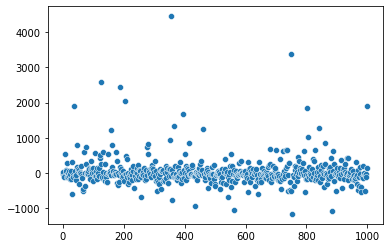

In [114]:
t = np.linspace(0, 1000, 579)
sns.scatterplot(t,feed['GT ']-feed['predict'])

In [ ]:
tuned_xlf = xgb.XGBRegressor(colsample_bytree=0.5, max_depth=4, n_estimators=500, seed=1422)
tuned_xlf.fit(X_train, y_train)

pred_best = tuned_xlf.predict(X_test)
print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,pred_best)))

[14:07:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Root Mean Square error"  280.38638685176016


In [ ]:
imp = pd.DataFrame({'feature' : X_train.columns, 'importance' : tuned_xlf.feature_importances_})
imp.sort_values(by = 'importance', ascending = False)

,feature,importance
16,e_level_2,0.483996
9,e_level_1,0.193874
23,e_level_3,0.061109
30,e_level_4,0.025682
58,e_level_2_3hour,0.024661
32,average_rain_5,0.019893
29,d_rain_4,0.016005
36,d_rain_5,0.013984
43,d_rain_6,0.011132
42,c_rain_6,0.007876


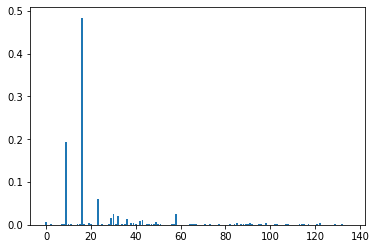

In [ ]:
plt.bar(range(len(tuned_xlf.feature_importances_)), tuned_xlf.feature_importances_)
plt.show()

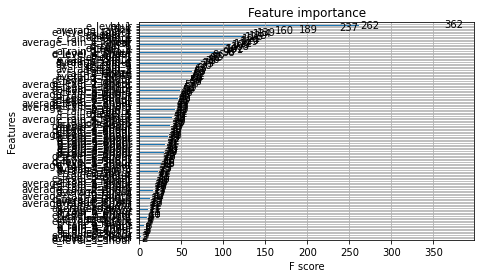

In [ ]:
from xgboost import plot_importance

# plot feature importance
plot_importance(tuned_xlf)
plt.show()

no_feature_engineering + GridSearch CV : 261.615

In [ ]:
too_over = np.where(feed['GT ']-feed['predict'] >1000)
feed.iloc[too_over].sort_values(by='GT ')

,predict,GT
478,6875.854004,8490.909462
477,6187.678223,8786.533449
476,5744.344727,8897.368225


In [ ]:
df_train.loc[feed.iloc[too_over].index].sort_values(by = 'target')

,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6,average_rain_1_3hour,a_rain_1_3hour,b_rain_1_3hour,c_rain_1_3hour,d_rain_1_3hour,e_level_1_3hour,d_level_1_3hour,average_rain_2_3hour,a_rain_2_3hour,b_rain_2_3hour,c_rain_2_3hour,d_rain_2_3hour,e_level_2_3hour,d_level_2_3hour,average_rain_3_3hour,a_rain_3_3hour,b_rain_3_3hour,c_rain_3_3hour,d_rain_3_3hour,e_level_3_3hour,d_level_3_3hour,average_rain_4_3hour,a_rain_4_3hour,b_rain_4_3hour,c_rain_4_3hour,d_rain_4_3hour,e_level_4_3hour,d_level_4_3hour,average_rain_5_3hour,a_rain_5_3hour,b_rain_5_3hour,c_rain_5_3hour,d_rain_5_3hour,e_level_5_3hour,d_level_5_3hour,average_rain_6_3hour,a_rain_6_3hour,b_rain_6_3hour,c_rain_6_3hour,d_rain_6_3hour,e_level_6_3hour,d_level_6_3hour,average_rain_1_6hour,a_rain_1_6hour,b_rain_1_6hour,c_rain_1_6hour,d_rain_1_6hour,e_level_1_6hour,d_level_1_6hour,average_rain_2_6hour,a_rain_2_6hour,b_rain_2_6hour,c_rain_2_6hour,d_rain_2_6hour,e_level_2_6hour,d_level_2_6hour,average_rain_3_6hour,a_rain_3_6hour,b_rain_3_6hour,c_rain_3_6hour,d_rain_3_6hour,e_level_3_6hour,d_level_3_6hour,average_rain_4_6hour,a_rain_4_6hour,b_rain_4_6hour,c_rain_4_6hour,d_rain_4_6hour,e_level_4_6hour,d_level_4_6hour,average_rain_5_6hour,a_rain_5_6hour,b_rain_5_6hour,c_rain_5_6hour,d_rain_5_6hour,e_level_5_6hour,d_level_5_6hour,average_rain_6_6hour,a_rain_6_6hour,b_rain_6_6hour,c_rain_6_6hour,d_rain_6_6hour,e_level_6_6hour,d_level_6_6hour,average_a_rain,average_b_rain,average_c_rain,average_d_rain,average_e_level,average_d_level
474,2,1,24,5,8148.207072,143.0734,1502,1020,592,690,45.30,729.000000,148.5034,252,170,94,108,7.55,121.500000,148.5034,252,170,100,117,7.55,121.500000,150.4975,252,170,104,119,7.55,121.500000,150.4975,252,170,104,119,7.55,121.500,150.4975,252,170,104,119,7.55,121.500,136.087833,237.666667,165.000000,75.333333,102.000000,7.250000,121.500000,142.051200,248.000000,165.000000,87.000000,102.000000,7.250000,121.500000,142.051200,248.000000,165.000000,93.333333,108.333333,7.250000,121.500000,147.358100,251.333333,165.000000,102.666667,118.333333,7.250000,121.500000,147.358100,251.333333,165.000000,102.666667,118.333333,7.250000,121.500000,147.358100,251.333333,165.000000,102.666667,118.333333,7.250000,121.500000,126.752633,231.833333,157.166667,50.000000,97.166667,6.800000,121.500000,133.796800,241.666667,157.166667,63.333333,97.166667,6.800000,121.500000,133.796800,241.666667,157.166667,75.833333,102.500000,6.800000,121.500000,139.243200,244.500000,157.166667,94.833333,110.166667,6.800000,121.500000,138.899700,244.500000,157.166667,94.833333,110.166667,6.800000,121.500000,138.865500,244.500000,157.166667,94.833333,110.166667,6.800000,121.500000,250.333333,170.0,98.666667,115.000000,7.55,121.500000
478,2,1,24,9,8490.909462,163.1144,1612,1158,829,913,52.50,729.000000,176.6852,268,193,110,119,8.75,121.500000,176.6852,268,193,139,144,8.75,121.500000,186.0485,274,193,159,177,8.75,121.500000,186.0485,274,193,159,177,8.75,121.500,186.0485,274,193,158,177,8.75,121.500,155.504900,252.666667,180.333333,102.666667,119.000000,8.450000,121.500000,164.234133,262.666667,180.333333,106.000000,119.000000,8.450000,121.500000,164.234133,262.666667,180.333333,117.666667,127.333333,8.450000,121.500000,175.282700,269.333333,180.333333,151.333333,165.000000,8.450000,121.500000,175.282700,269.333333,180.333333,151.333333,165.000000,8.450000,121.500000,175.282700,269.333333,180.333333,151.000000,165.000000,8.450000,121.500000,148.778050,247.666667,175.166667,94.833333,113.666667,8.000000,121.500000,155.796117,257.000000,175.166667,99.666667,113.666667,8.000000,121.500000,155.796117,257.000000,

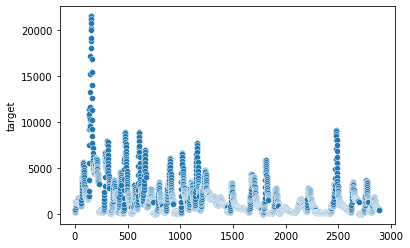

In [ ]:
sns.scatterplot(np.arange(0,3051), df['target'])

### Back Test

In [ ]:
imp = imp.sort_values(by = 'importance', ascending= False)
imp

,feature,importance
9,e_level_1,0.407328
32,average_rain_5,0.157507
29,d_rain_4,0.055795
43,d_rain_6,0.040476
51,e_level_1_3hour,0.035902
129,d_level_6_6hour,0.032469
0,year,0.018417
25,average_rain_4,0.015137
87,d_level_6_3hour,0.014944
42,c_rain_6,0.011658


In [ ]:
backtest_cols = imp[imp['importance']>0.005].feature
backtest_cols

9                 e_level_1
32           average_rain_5
29                 d_rain_4
43                 d_rain_6
51          e_level_1_3hour
129         d_level_6_6hour
0                      year
25           average_rain_4
87          d_level_6_3hour
42                 c_rain_6
98           c_rain_2_6hour
8                  d_rain_1
39           average_rain_6
91           c_rain_1_6hour
73          d_level_4_3hour
115         d_level_4_6hour
88     average_rain_1_6hour
2                       day
4            average_rain_1
71           d_rain_4_3hour
15                 d_rain_2
96           a_rain_2_6hour
94          d_level_1_6hour
101         d_level_2_6hour
92           d_rain_1_6hour
Name: feature, dtype: object

In [ ]:
backtest_df = df[backtest_cols.to_list()]
backtest_df

,e_level_1,average_rain_5,d_rain_4,d_rain_6,e_level_1_3hour,d_level_6_6hour,year,average_rain_4,d_level_6_3hour,c_rain_6,c_rain_2_6hour,d_rain_1,average_rain_6,c_rain_1_6hour,d_level_4_3hour,d_level_4_6hour,average_rain_1_6hour,day,average_rain_1,d_rain_4_3hour,d_rain_2,a_rain_2_6hour,d_level_1_6hour,d_level_2_6hour,d_rain_1_6hour
0,15.24,6.4000,8,8,2.533333,122.587500,2006,6.4000,122.600000,8,8.166667,48,6.4000,7.666667,122.667857,122.653571,7.650000,10,6.4000,9.666667,8,8.166667,122.559375,122.561111,8.833333
1,15.18,7.3000,10,10,2.533333,122.587500,2006,7.3000,122.600000,10,8.166667,54,7.3000,7.666667,122.667857,122.653571,7.650000,10,6.3000,9.666667,8,8.166667,122.559375,122.561111,8.833333
2,15.18,8.2000,11,11,2.533333,122.587500,2006,8.2000,122.600000,10,8.166667,57,8.2000,7.666667,122.667857,122.653571,7.650000,10,6.4000,9.666667,8,8.166667,122.559375,122.561111,8.833333
3,15.18,11.3000,14,14,2.530000,122.587500,2006,11.3000,122.591667,15,8.166667,68,11.3000,7.666667,122.660714,122.653571,7.650000,10,7.3000,11.666667,8,8.166667,122.559375,122.561111,8.833333
4,15.18,14.4000,16,16,2.530000,122.587500,2006,14.4000,122.583333,18,8.166667,79,14.4000,7.666667,122.651190,122.653571,7.650000,10,8.2000,13.666667,10,8.166667,122.559375,122.561111,8.833333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3046,18.96,2.3689,0,0,3.176667,129.906667,2018,2.3689,129.933333,0,0.500000,0,2.1722,0.833333,129.864286,129.833333,6.646700,7,2.3689,0.000000,0,1.500000,129.953125,129.993056,0.000000
3047,18.90,2.3689,0,0,3.163333,129.925000,2018,2.3689,129.951667,0,0.333333,0,2.0805,0.666667,129.880952,129.852976,3.948850,7,2.3689,0.000000,0,1.000000,129.969792,130.004167,0.000000
3048,18.78,2.3689,0,0,3.146667,129.941667,2018,2.3689,129.966667,0,0.166667,0,2.0354,0.500000,129.896429,129.870833,2.829700,7,2.3689,0.000000,0,1.000000,129.984375,130.012500,0.000000
3049,18.66,2.3488,0,0,3.130000,129.956667,2018,2.3689,129.980000,0,0.000000,0,1.8993,0.333333,129.910714,129.887500,2.454867,7,2.3689,0.000000,0,1.000000,129.995833,130.018056,0.000000


In [ ]:
# encoding
df_train = backtest_df[:-160]


df_train['year'] =  df_train['year'].astype('category')
df_train['year'] = df_train.year.cat.codes

df_train['day'] =  df_train['day'].astype('category')
df_train['day'] = df_train.day.cat.codes


y = df['target'][:-160]
# X = df_train.drop("target", axis =1)
X
# split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1422)
print(X_train.shape, X_test.shape)
xlf_back = xgb.XGBRegressor(seed=1422)
xlf_back.fit(X_train,y_train)
preds = xlf_back.predict(X_test)

print('\nRoot Mean Square error" ', math.sqrt(mean_squared_error(y_test,preds)))

(2312, 136) (579, 136)
[10:23:42] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.

Root Mean Square error"  371.9286520052811


## Pycaret

In [ ]:
from pycaret.regression import *

df1 = df[:-160]
df1= df1.drop('num',axis =1 )
df1

,year,month,day,hour,target,average_rain_1,a_rain_1,b_rain_1,c_rain_1,d_rain_1,e_level_1,d_level_1,average_rain_2,a_rain_2,b_rain_2,c_rain_2,d_rain_2,e_level_2,d_level_2,average_rain_3,a_rain_3,b_rain_3,c_rain_3,d_rain_3,e_level_3,d_level_3,average_rain_4,a_rain_4,b_rain_4,c_rain_4,d_rain_4,e_level_4,d_level_4,average_rain_5,a_rain_5,b_rain_5,c_rain_5,d_rain_5,e_level_5,d_level_5,average_rain_6,a_rain_6,b_rain_6,c_rain_6,d_rain_6,e_level_6,d_level_6,average_rain_1_3hour,a_rain_1_3hour,b_rain_1_3hour,c_rain_1_3hour,d_rain_1_3hour,e_level_1_3hour,d_level_1_3hour,average_rain_2_3hour,a_rain_2_3hour,b_rain_2_3hour,c_rain_2_3hour,d_rain_2_3hour,e_level_2_3hour,d_level_2_3hour,average_rain_3_3hour,a_rain_3_3hour,b_rain_3_3hour,c_rain_3_3hour,d_rain_3_3hour,e_level_3_3hour,d_level_3_3hour,average_rain_4_3hour,a_rain_4_3hour,b_rain_4_3hour,c_rain_4_3hour,d_rain_4_3hour,e_level_4_3hour,d_level_4_3hour,average_rain_5_3hour,a_rain_5_3hour,b_rain_5_3hour,c_rain_5_3hour,d_rain_5_3hour,e_level_5_3hour,d_level_5_3hour,average_rain_6_3hour,a_rain_6_3hour,b_rain_6_3hour,c_rain_6_3hour,d_rain_6_3hour,e_level_6_3hour,d_level_6_3hour,average_rain_1_6hour,a_rain_1_6hour,b_rain_1_6hour,c_rain_1_6hour,d_rain_1_6hour,e_level_1_6hour,d_level_1_6hour,average_rain_2_6hour,a_rain_2_6hour,b_rain_2_6hour,c_rain_2_6hour,d_rain_2_6hour,e_level_2_6hour,d_level_2_6hour,average_rain_3_6hour,a_rain_3_6hour,b_rain_3_6hour,c_rain_3_6hour,d_rain_3_6hour,e_level_3_6hour,d_level_3_6hour,average_rain_4_6hour,a_rain_4_6hour,b_rain_4_6hour,c_rain_4_6hour,d_rain_4_6hour,e_level_4_6hour,d_level_4_6hour,average_rain_5_6hour,a_rain_5_6hour,b_rain_5_6hour,c_rain_5_6hour,d_rain_5_6hour,e_level_5_6hour,d_level_5_6hour,average_rain_6_6hour,a_rain_6_6hour,b_rain_6_6hour,c_rain_6_6hour,d_rain_6_6hour,e_level_6_6hour,d_level_6_6hour,average_a_rain,average_b_rain,average_c_rain,average_d_rain,average_e_level,average_d_level
0,2006,7,10,8,189.100000,6.4000,42,42,45,48,15.24,735.605417,6.3000,7,7,7,8,2.54,122.541667,6.3000,7,7,7,8,2.54,122.550000,6.4000,7,7,8,8,2.54,122.675000,6.4000,7,7,8,8,2.54,122.660,6.4000,7,7,8,8,2.54,122.610,6.366667,7.000000,8.000000,7.000000,8.000000,2.533333,122.562500,6.666667,7.000000,8.000000,7.000000,8.000000,2.533333,122.550000,6.666667,7.000000,8.000000,7.333333,8.000000,2.533333,122.558333,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.667857,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.648000,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.600000,7.650000,7.000000,10.000000,7.666667,8.833333,2.531667,122.559375,8.983333,8.166667,10.000000,8.166667,8.833333,2.531667,122.561111,8.983333,8.166667,10.0,9.5,9.833333,2.531667,122.566667,10.750000,9.333333,10.0,13.500000,12.666667,2.531667,122.653571,10.750000,9.333333,10.0,13.500000,12.666667,2.531667,122.626667,10.750000,9.333333,10.0,13.333333,12.666667,2.531667,122.587500,7.000000,7.0,7.500000,8.000000,2.54,122.600903
1,2006,7,10,9,216.951962,6.3000,42,48,51,54,15.18,735.586690,6.4000,7,8,7,8,2.53,122.550000,6.4000,7,8,7,8,2.53,122.558333,7.3000,7,8,10,10,2.53,122.667857,7.3000,7,8,10,10,2.53,122.648,7.3000,7,8,10,10,2.53,122.600,6.366667,7.000000,8.000000,7.000000,8.000000,2.533333,122.562500,6.666667,7.000000,8.000000,7.000000,8.000000,2.533333,122.550000,6.666667,7.000000,8.000000,7.333333,8.000000,2.533333,122.558333,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.667857,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.648000,7.300000,7.000000,8.000000,9.333333,9.666667,2.533333,122.600000,7.650000,7.000000,10.000000,7.666667,8.833333,2.531667,122.559375,8.983333,8.166667,10.000000,8.166667,8.833333,2.531667,122.561111,8.983333,8.166667,10.0,9.5,9.833333,2.531667,122.566667,10.750000,9.333333,10.0,13.500000,12.666667,2.531667,122.653571,10.750000,9.333333,10.0,13.500000,12.666667,2.531667,122.626667,10.750000,9.333333,10.0,13.333333,12.666667,2.531667,122.587500,7.000000,8.0,8.500000,9.000000,2.53,122.597782
2,2006,7,10,10,251.424419,6.4000,42,54

In [ ]:
pyc = setup(df1, target = 'target',date_features =['year','month','day','hour'], session_id = 1422)

,Description,Value
0,session_id,1422
1,Target,target
2,Original Data,"(2891, 137)"
3,Missing Values,False
4,Numeric Features,132
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(2023, 43)"


In [ ]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,127.6701,1.126651e+05,330.5252,0.9750,0.2342,0.1472,1.081
lightgbm,Light Gradient Boosting Machine,221.9429,2.446174e+05,483.6157,0.9483,0.2936,0.2250,0.266
knn,K Neighbors Regressor,249.1548,2.480639e+05,494.5557,0.9444,0.3595,0.2819,0.070
rf,Random Forest Regressor,207.9430,3.595793e+05,560.0704,0.9281,0.2679,0.1898,2.059
gbr,Gradient Boosting Regressor,337.7638,3.375367e+05,578.0577,0.9238,0.4174,0.4089,0.704
dt,Decision Tree Regressor,233.5985,6.551406e+05,725.3423,0.8709,0.3181,0.1848,0.044
lasso,Lasso Regression,702.7588,1.206687e+06,1095.2144,0.7287,0.9006,1.2714,0.035
ridge,Ridge Regression,700.2503,1.204562e+06,1094.4645,0.7284,0.8798,1.2731,0.016
lr,Linear Regression,700.3068,1.204619e+06,1094.4904,0.7283,0.8800,1.2733,0.280
br,Bayesian Ridge,700.4995,1.214928e+06,1099.1874,0.7265,0.9246,1.2135,0.022


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=1422, verbose=0, warm_start=False)